# Verify Full Dataset - 100 Random Samples

This notebook verifies the processed dataset by displaying 100 random pairs of:
- Synthetic images (cropped to 512x512)
- Original images (processed with Method 3)

**Input folders:**
- `/hpcstor6/scratch01/a/a.kanamarlapudi001/synthetic/full_synthetic_resized/`
- `/hpcstor6/scratch01/a/a.kanamarlapudi001/synthetic/full_original_method3/`


In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import glob
import random

print("Libraries imported successfully!")


Libraries imported successfully!


## Step 1: Load Processed Images


In [2]:
# Processed image paths
SYNTHETIC_PATH = '/hpcstor6/scratch01/a/a.kanamarlapudi001/synthetic/full_synthetic_resized/'
ORIGINAL_PATH = '/hpcstor6/scratch01/a/a.kanamarlapudi001/synthetic/full_original_method3/'

# Get all files
synthetic_files = sorted(glob.glob(os.path.join(SYNTHETIC_PATH, '*.png')))
original_files = sorted(glob.glob(os.path.join(ORIGINAL_PATH, '*.png')))

print("="*70)
print("LOADED FILES")
print("="*70)
print(f"\n📊 Synthetic images: {len(synthetic_files):,}")
print(f"📊 Original images: {len(original_files):,}")
print("="*70)


LOADED FILES

📊 Synthetic images: 99,999
📊 Original images: 163,568


## Step 2: Select 100 Random Pairs


In [3]:
# Select 100 random samples from each
random.seed(42)  # For reproducibility
num_samples = min(100, len(synthetic_files), len(original_files))

selected_synthetic = random.sample(synthetic_files, num_samples)
selected_original = random.sample(original_files, num_samples)

print(f"✅ Selected {num_samples} random pairs for comparison")


✅ Selected 100 random pairs for comparison


## Step 3: Quick Statistics Check


In [4]:
# Analyze sample statistics
syn_stats = {'dims': [], 'mean': [], 'min': [], 'max': [], 'std': []}
orig_stats = {'dims': [], 'mean': [], 'min': [], 'max': [], 'std': []}
syn_out_of_range = []
orig_out_of_range = []

print("Analyzing 100 samples...")

for syn_file, orig_file in zip(selected_synthetic, selected_original):
    # Synthetic
    syn_img = cv2.imread(syn_file, cv2.IMREAD_GRAYSCALE)
    syn_stats['dims'].append(syn_img.shape)
    syn_stats['mean'].append(syn_img.mean())
    syn_stats['min'].append(syn_img.min())
    syn_stats['max'].append(syn_img.max())
    syn_stats['std'].append(syn_img.std())
    
    # Check range
    if syn_img.min() < 0 or syn_img.max() > 255:
        syn_out_of_range.append(os.path.basename(syn_file))
    
    # Original
    orig_img = cv2.imread(orig_file, cv2.IMREAD_GRAYSCALE)
    orig_stats['dims'].append(orig_img.shape)
    orig_stats['mean'].append(orig_img.mean())
    orig_stats['min'].append(orig_img.min())
    orig_stats['max'].append(orig_img.max())
    orig_stats['std'].append(orig_img.std())
    
    # Check range
    if orig_img.min() < 0 or orig_img.max() > 255:
        orig_out_of_range.append(os.path.basename(orig_file))

print("\n" + "="*70)
print("STATISTICS SUMMARY (100 samples)")
print("="*70)

print("\n📊 Synthetic images:")
print(f"  Dimensions: {set(syn_stats['dims'])}")
print(f"  Mean: {np.mean(syn_stats['mean']):.1f} ± {np.std(syn_stats['mean']):.1f}")
print(f"  Min: {np.min(syn_stats['min']):.0f}")
print(f"  Max: {np.max(syn_stats['max']):.0f}")
print(f"  Std: {np.mean(syn_stats['std']):.1f} ± {np.std(syn_stats['std']):.1f}")
print(f"  ✅ Pixel Range: [{np.min(syn_stats['min']):.0f}, {np.max(syn_stats['max']):.0f}]")
print(f"  Out of [0-255] range: {len(syn_out_of_range)}/100")

print("\n📊 Original images (Method 3):")
print(f"  Dimensions: {set(orig_stats['dims'])}")
print(f"  Mean: {np.mean(orig_stats['mean']):.1f} ± {np.std(orig_stats['mean']):.1f}")
print(f"  Min: {np.min(orig_stats['min']):.0f}")
print(f"  Max: {np.max(orig_stats['max']):.0f}")
print(f"  Std: {np.mean(orig_stats['std']):.1f} ± {np.std(orig_stats['std']):.1f}")
print(f"  ✅ Pixel Range: [{np.min(orig_stats['min']):.0f}, {np.max(orig_stats['max']):.0f}]")
print(f"  Out of [0-255] range: {len(orig_out_of_range)}/100")

print("\n✅ Dimension Match:", "YES" if set(syn_stats['dims']) == set(orig_stats['dims']) == {(512, 512)} else "NO")

if len(syn_out_of_range) == 0 and len(orig_out_of_range) == 0:
    print("✅ Pixel Range Match: ALL images in [0, 255]!")
else:
    print(f"⚠️ Pixel Range Issue: {len(syn_out_of_range) + len(orig_out_of_range)} images out of range")
    
print("="*70)


Analyzing 100 samples...

STATISTICS SUMMARY (100 samples)

📊 Synthetic images:
  Dimensions: {(512, 512)}
  Mean: 32.1 ± 11.2
  Min: 0
  Max: 255
  Std: 47.0 ± 7.0
  ✅ Pixel Range: [0, 255]
  Out of [0-255] range: 0/100

📊 Original images (Method 3):
  Dimensions: {(512, 512)}
  Mean: 21.9 ± 9.3
  Min: 0
  Max: 255
  Std: 41.4 ± 9.0
  ✅ Pixel Range: [0, 255]
  Out of [0-255] range: 0/100

✅ Dimension Match: YES
✅ Pixel Range Match: ALL images in [0, 255]!


## Step 4: Display 100 Pairs Side-by-Side

⚠️ **This will create a VERY LARGE plot!** It may take a minute to render.


Creating plot with 100 pairs (this may take a minute)...



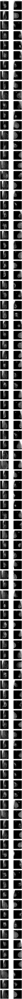


✅ 100 pairs displayed successfully!


In [5]:
# Create massive plot: 100 rows x 2 columns
fig, axes = plt.subplots(num_samples, 2, figsize=(10, 3*num_samples))

print(f"Creating plot with {num_samples} pairs (this may take a minute)...\n")

for i in range(num_samples):
    # Load images
    syn_img = cv2.imread(selected_synthetic[i], cv2.IMREAD_GRAYSCALE)
    orig_img = cv2.imread(selected_original[i], cv2.IMREAD_GRAYSCALE)
    
    # Get filenames
    syn_name = os.path.basename(selected_synthetic[i])
    orig_name = os.path.basename(selected_original[i])
    
    # Synthetic
    axes[i, 0].imshow(syn_img, cmap='gray', vmin=0, vmax=255)
    axes[i, 0].set_title(f'Synthetic {i+1}: {syn_name[:20]}...\n{syn_img.shape} | Mean: {syn_img.mean():.1f}', 
                         fontsize=8)
    axes[i, 0].axis('off')
    
    # Original
    axes[i, 1].imshow(orig_img, cmap='gray', vmin=0, vmax=255)
    axes[i, 1].set_title(f'Original {i+1}: {orig_name[:20]}...\n{orig_img.shape} | Mean: {orig_img.mean():.1f}', 
                         fontsize=8)
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()

print("\n✅ 100 pairs displayed successfully!")


## Step 5: Final Summary


In [6]:
print("="*70)
print("VERIFICATION COMPLETE!")
print("="*70)

print("\n✅ Dataset Processing Summary:")
print(f"  Total synthetic images: {len(synthetic_files):,}")
print(f"  Total original images: {len(original_files):,}")
print(f"  All dimensions: 512 x 512")
print(f"  Method used: Method 3 (DICOM windowing from metadata)")

print("\n📊 Sample Statistics (from 100 pairs):")
print(f"  Synthetic mean: {np.mean(syn_stats['mean']):.1f}")
print(f"  Original mean: {np.mean(orig_stats['mean']):.1f}")
print(f"  Difference: {abs(np.mean(syn_stats['mean']) - np.mean(orig_stats['mean'])):.1f}")

print("\n✨ NEXT STEPS:")
print("  1. Review the 100 pairs above")
print("  2. If they look good → Ready for classifier training!")
print("  3. Train binary classifier: Synthetic vs Original")
print("  4. Goal: Accuracy ≈ 50% means GAN is very realistic!")

print("\n📁 Processed datasets located at:")
print(f"  Synthetic: {SYNTHETIC_PATH}")
print(f"  Original:  {ORIGINAL_PATH}")
print("="*70)


VERIFICATION COMPLETE!

✅ Dataset Processing Summary:
  Total synthetic images: 99,999
  Total original images: 163,568
  All dimensions: 512 x 512
  Method used: Method 3 (DICOM windowing from metadata)

📊 Sample Statistics (from 100 pairs):
  Synthetic mean: 32.1
  Original mean: 21.9
  Difference: 10.2

✨ NEXT STEPS:
  1. Review the 100 pairs above
  2. If they look good → Ready for classifier training!
  3. Train binary classifier: Synthetic vs Original
  4. Goal: Accuracy ≈ 50% means GAN is very realistic!

📁 Processed datasets located at:
  Synthetic: /hpcstor6/scratch01/a/a.kanamarlapudi001/synthetic/full_synthetic_resized/
  Original:  /hpcstor6/scratch01/a/a.kanamarlapudi001/synthetic/full_original_method3/
